# HR Analytics Project- Understanding the Attrition in HR

# Problem Statement

Every year a lot of companies hire a number of employees. The companies invest time and money in 
training those employees, not just this but there are training programs within the companies for 
their existing employees as well. The aim of these programs is to increase the effectiveness of 
their employees. But where HR Analytics fit in this? and is it just about improving the performance
of employees?

HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to 
applying analytic processes to the human resource department of an organization in the hope of 
improving employee performance and therefore getting a better return on investment. HR analytics 
does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight 
into each process by gathering data and then using it to make relevant decisions about how to 
improve these processes.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? 
We will discuss the first question here and for the second question, we will write the code a
nd try to understand the process step by step.


# Importing required Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Loading the dataset

In [2]:
df=pd.read_csv('HR-Attrition.csv')

In [3]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [4]:
df.sample()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1059,35,No,Travel_Rarely,660,Sales,7,1,Life Sciences,1,1492,...,1,80,1,1,3,3,1,0,0,0


In [5]:
pd.set_option('display.max_rows',None)

In [6]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,...,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,...,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,...,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,...,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,...,2,80,2,17,3,2,7,7,7,7


In [7]:
pd.set_option('display.max_columns',None)

In [8]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


In [9]:
df.sample()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1426,32,No,Travel_Rarely,267,Research & Development,29,4,Life Sciences,1,2010,3,Female,49,2,1,Laboratory Technician,2,Single,2837,15919,1,Y,No,13,3,3,80,0,6,3,3,6,2,4,1


In [10]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [11]:
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,2,Male,82,4,2,Laboratory Technician,3,Married,4404,10228,2,Y,No,12,3,1,80,0,6,3,4,4,3,1,2


Statistical Summary

In [12]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [13]:
df_new=df.drop(['BusinessTravel','DailyRate','Education','EmployeeCount','HourlyRate','Gender',
               'HourlyRate','MaritalStatus','MonthlyRate','NumCompaniesWorked','Over18',
               'StandardHours','StockOptionLevel','TrainingTimesLastYear','YearsAtCompany',
               'YearsInCurrentRole','YearsWithCurrManager','EducationField','JobRole','JobLevel','Department'],axis=1)

In [14]:
df_new

,Age,Attrition,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsSinceLastPromotion
0,41,Yes,1,1,2,3,4,5993,Yes,11,3,1,8,1,0
1,49,No,8,2,3,2,2,5130,No,23,4,4,10,3,1
2,37,Yes,2,4,4,2,3,2090,Yes,15,3,2,7,3,0
3,33,No,3,5,4,3,3,2909,Yes,11,3,3,8,3,3
4,27,No,2,7,1,3,2,3468,No,12,3,4,6,3,2
5,32,No,2,8,4,3,4,3068,No,13,3,3,8,2,3
6,59,No,3,10,3,4,1,2670,Yes,20,4,1,12,2,0
7,30,No,24,11,4,3,3,2693,No,22,4,2,1,3,0
8,38,No,23,12,4,2,3,9526,No,21,4,2,10,3,1
9,36,No,27,13,3,3,3,5237,No,13,3,2,17,2,7


In [15]:
df_new.shape

(1470, 15)

In [16]:
df.shape

(1470, 35)

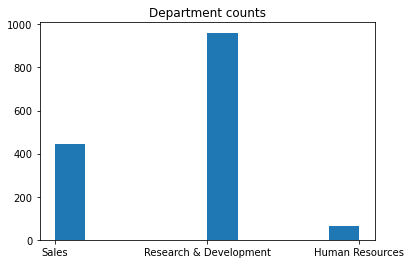

In [17]:
df['Department'].hist(grid=False)
plt.title('Department counts')
plt.show()

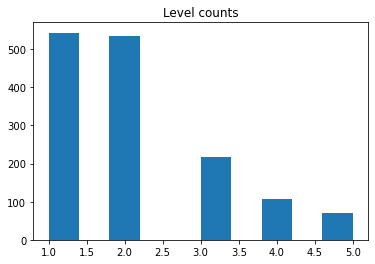

In [18]:
df['JobLevel'].hist(grid=False)
plt.title('Level counts')
plt.show()

# Label Encoder

In [19]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df_new['Attrition']=le.fit_transform(df_new['Attrition'])

In [20]:
le.inverse_transform([1,0])

array(['Yes', 'No'], dtype=object)

# Checking Correlation

In [40]:
df_new.corr()

,Age,Attrition,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsSinceLastPromotion
Age,1.000000,-0.159205,-0.001686,-0.010145,0.010146,0.029820,-0.004892,0.497855,0.003634,0.001904,0.053535,0.680381,-0.021490,0.216513
Attrition,-0.159205,1.000000,0.077924,-0.010577,-0.103369,-0.130016,-0.103481,-0.159840,-0.013478,0.002889,-0.045872,-0.171063,-0.063939,-0.033019
DistanceFromHome,-0.001686,0.077924,1.000000,0.032916,-0.016075,0.008783,-0.003669,-0.017014,0.040235,0.027110,0.006557,0.004628,-0.026556,0.010029
EmployeeNumber,-0.010145,-0.010577,0.032916,1.000000,0.017621,-0.006888,-0.046247,-0.014829,-0.012944,-0.020359,-0.069861,-0.014365,0.010309,-0.009019
EnvironmentSatisfaction,0.010146,-0.103369,-0.016075,0.017621,1.000000,-0.008278,-0.006784,-0.006259,-0.031701,-0.029548,0.007665,-0.002693,0.027627,0.016194
JobInvolvement,0.029820,-0.130016,0.008783,-0.006888,-0.008278,1.000000,-0.021476,-0.015271,-0.017205,-0.029071,0.034297,-0.005533,-0.014617,-0.024184
JobSatisfaction,-0.004892,-0.103481,-0.003669,-0.046247,-0.006784,-0.021476,1.000000,-0.007157,0.020002,0.002297,-0.012454,-0.020185,-0.019459,-0.018214
MonthlyIncome,0.497855,-0.159840,-0.017014,-0.014829,-0.006259,-0.015271,-0.007157,1.000000,-0.027269,-0.017120,0.025873,0.772893,0.030683,0.344978
PercentSalaryHike,0.003634,-0.013478,0.040235,-0.012944,-0.031701,-0.017205,0.020002,-0.027269,1.000000,0.773550,-0.040490,-0.020608,-0.003280,-0.022154
PerformanceRating,0.001904,0.002889,0.027110,-0.020359,-0.029548,-0.029071,0.002297,-0.017120,0.773550,1.000000,-0.031351,0.006744,0.002572,0.017896


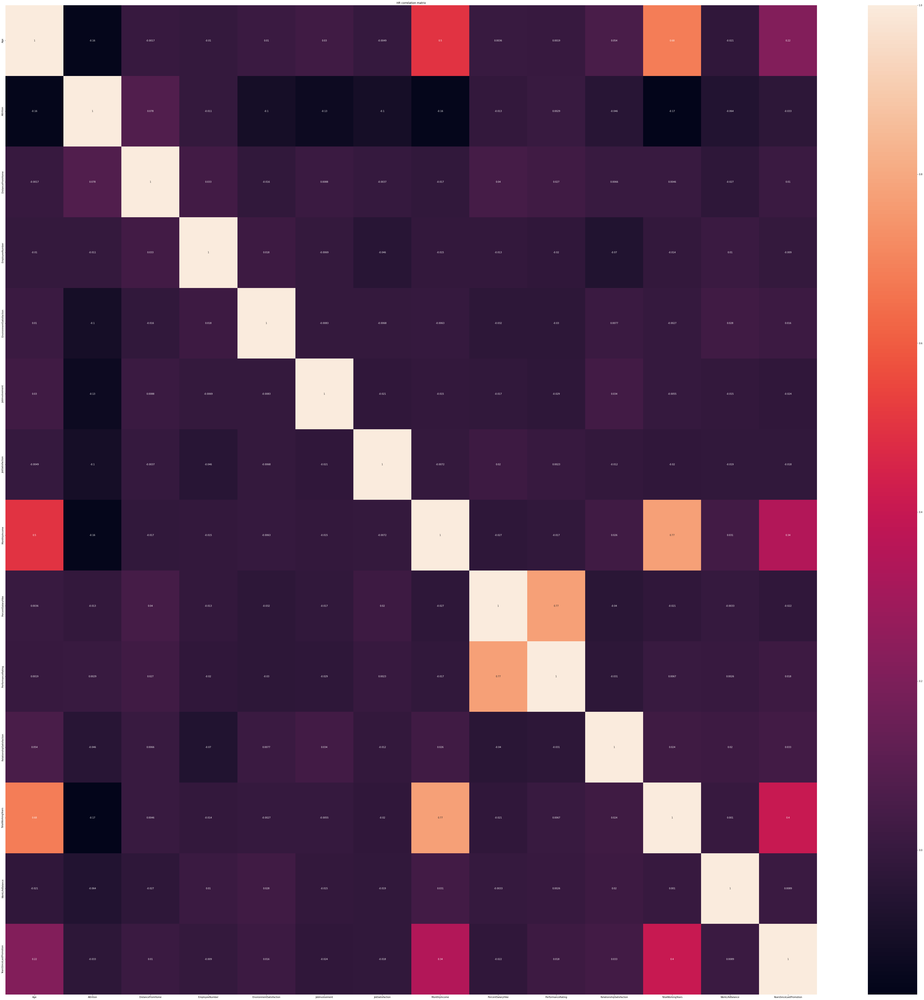

In [41]:
corr_mat=df_new.corr()
# size of the canvas
plt.figure(figsize=[80,80])
# plot the correlation matrix
sns.heatmap(corr_mat,annot=True)
plt.title('HR correlation matrix')
plt.savefig('correlation_matrix.jpg')
plt.show()

We are unable to identify the correlation in above heatmap due to huge number of columns

In [25]:
corr_matrix=df_new.corr()
corr_matrix

,Age,Attrition,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsSinceLastPromotion
Age,1.000000,-0.159205,-0.001686,-0.010145,0.010146,0.029820,-0.004892,0.497855,0.003634,0.001904,0.053535,0.680381,-0.021490,0.216513
Attrition,-0.159205,1.000000,0.077924,-0.010577,-0.103369,-0.130016,-0.103481,-0.159840,-0.013478,0.002889,-0.045872,-0.171063,-0.063939,-0.033019
DistanceFromHome,-0.001686,0.077924,1.000000,0.032916,-0.016075,0.008783,-0.003669,-0.017014,0.040235,0.027110,0.006557,0.004628,-0.026556,0.010029
EmployeeNumber,-0.010145,-0.010577,0.032916,1.000000,0.017621,-0.006888,-0.046247,-0.014829,-0.012944,-0.020359,-0.069861,-0.014365,0.010309,-0.009019
EnvironmentSatisfaction,0.010146,-0.103369,-0.016075,0.017621,1.000000,-0.008278,-0.006784,-0.006259,-0.031701,-0.029548,0.007665,-0.002693,0.027627,0.016194
JobInvolvement,0.029820,-0.130016,0.008783,-0.006888,-0.008278,1.000000,-0.021476,-0.015271,-0.017205,-0.029071,0.034297,-0.005533,-0.014617,-0.024184
JobSatisfaction,-0.004892,-0.103481,-0.003669,-0.046247,-0.006784,-0.021476,1.000000,-0.007157,0.020002,0.002297,-0.012454,-0.020185,-0.019459,-0.018214
MonthlyIncome,0.497855,-0.159840,-0.017014,-0.014829,-0.006259,-0.015271,-0.007157,1.000000,-0.027269,-0.017120,0.025873,0.772893,0.030683,0.344978
PercentSalaryHike,0.003634,-0.013478,0.040235,-0.012944,-0.031701,-0.017205,0.020002,-0.027269,1.000000,0.773550,-0.040490,-0.020608,-0.003280,-0.022154
PerformanceRating,0.001904,0.002889,0.027110,-0.020359,-0.029548,-0.029071,0.002297,-0.017120,0.773550,1.000000,-0.031351,0.006744,0.002572,0.017896


In [26]:
type(corr_matrix)

pandas.core.frame.DataFrame

In [28]:
corr_matrix=df_new.corr()
corr_matrix['Attrition'].sort_values(ascending=False)

Attrition                   1.000000
DistanceFromHome            0.077924
PerformanceRating           0.002889
EmployeeNumber             -0.010577
PercentSalaryHike          -0.013478
YearsSinceLastPromotion    -0.033019
RelationshipSatisfaction   -0.045872
WorkLifeBalance            -0.063939
EnvironmentSatisfaction    -0.103369
JobSatisfaction            -0.103481
JobInvolvement             -0.130016
Age                        -0.159205
MonthlyIncome              -0.159840
TotalWorkingYears          -0.171063
Name: Attrition, dtype: float64

There is a strong correlation between the Distance from home and attrition rate whereas the very weak 
correlation between total working years and attrition rate

 Visualization 

(0.01, 1.05)

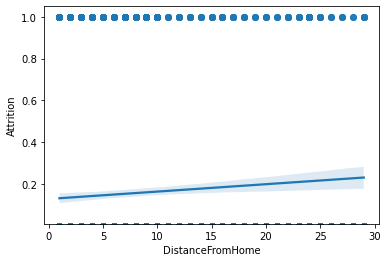

In [32]:
sns.regplot(x='DistanceFromHome',y='Attrition',data=df_new)
plt.ylim(0.01,)

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Attrition'>

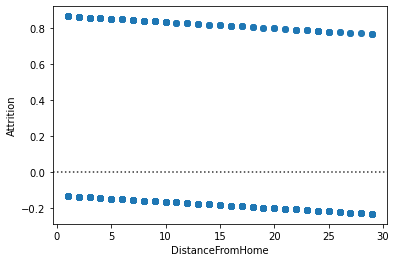

In [33]:
sns.residplot(df_new['DistanceFromHome'],df_new['Attrition'])

(0.01, 1.05)

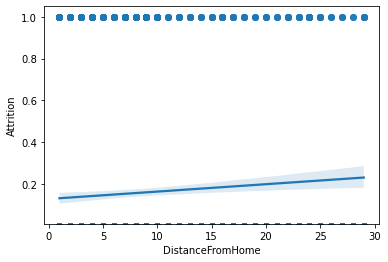

In [35]:
sns.regplot(x='PerformanceRating',y='Attrition',data=df_new)
plt.ylim(0.01,)

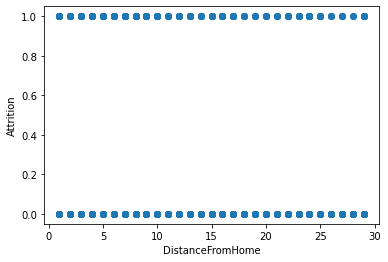

In [39]:
plt.scatter(df_new['DistanceFromHome'],df_new['Attrition'])
plt.xlabel('DistanceFromHome')
plt.ylabel('Attrition')
plt.show()

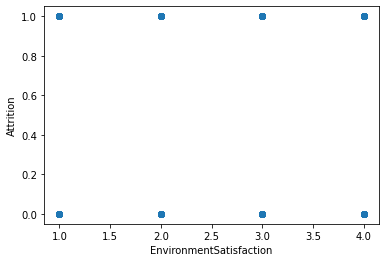

In [42]:
plt.scatter(df_new['EnvironmentSatisfaction'],df_new['Attrition'])
plt.xlabel('EnvironmentSatisfaction')
plt.ylabel('Attrition')
plt.show()

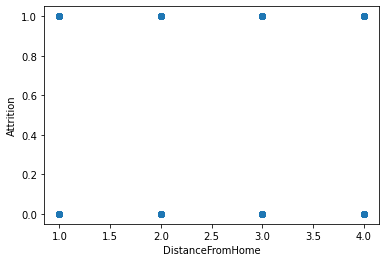

In [45]:
plt.scatter(df_new['JobSatisfaction'],df_new['Attrition'])
plt.xlabel('JobSatisfaction')
plt.ylabel('Attrition')
plt.show()

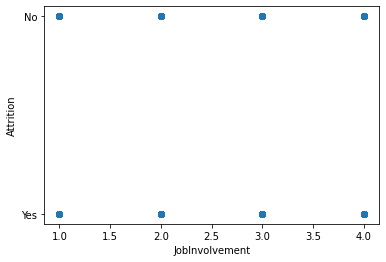

In [48]:
plt.scatter(df['JobInvolvement'],df['Attrition'])
plt.xlabel('JobInvolvement')
plt.ylabel('Attrition')
plt.show()

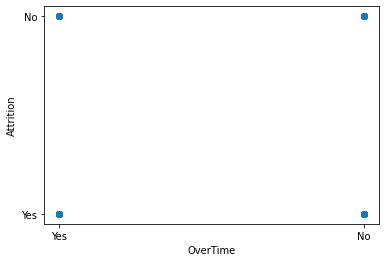

In [49]:
plt.scatter(df['OverTime'],df['Attrition'])
plt.xlabel('OverTime')
plt.ylabel('Attrition')
plt.show()

 Lets check the data distribution amoong all the columns

array([[<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:yl

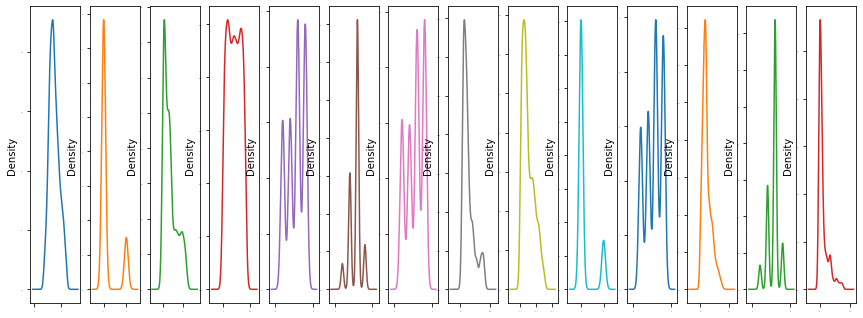

In [52]:
df_new.plot(kind='density',subplots=True,layout=(2,17),sharex=False,legend=False,fontsize=1,figsize=(18,12))

We can see skewness in data for multiple columns will handle the skewness in further steps

In [66]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df_new['OverTime']=le.fit_transform(df_new['OverTime'])


In [67]:
le.inverse_transform([1,0])

array(['Yes', 'No'], dtype=object)

In [68]:
x=df_new.drop('Attrition',axis=1)
y=df_new['Attrition']

In [69]:
x

,Age,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsSinceLastPromotion
0,41,1,1,2,3,4,5993,1,11,3,1,8,1,0
1,49,8,2,3,2,2,5130,0,23,4,4,10,3,1
2,37,2,4,4,2,3,2090,1,15,3,2,7,3,0
3,33,3,5,4,3,3,2909,1,11,3,3,8,3,3
4,27,2,7,1,3,2,3468,0,12,3,4,6,3,2
5,32,2,8,4,3,4,3068,0,13,3,3,8,2,3
6,59,3,10,3,4,1,2670,1,20,4,1,12,2,0
7,30,24,11,4,3,3,2693,0,22,4,2,1,3,0
8,38,23,12,4,2,3,9526,0,21,4,2,10,3,1
9,36,27,13,3,3,3,5237,0,13,3,2,17,2,7


In [70]:
y

0       1
1       0
2       1
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      1
15      0
16      0
17      0
18      0
19      0
20      0
21      1
22      0
23      0
24      1
25      0
26      1
27      0
28      0
29      0
30      0
31      0
32      0
33      1
34      1
35      0
36      1
37      0
38      0
39      0
40      0
41      0
42      1
43      0
44      0
45      1
46      0
47      0
48      0
49      0
50      1
51      1
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      1
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      1
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


In [71]:
# Checking Skewness
x.skew().sort_values(ascending=False)

YearsSinceLastPromotion     1.984290
PerformanceRating           1.921883
MonthlyIncome               1.369817
TotalWorkingYears           1.117172
OverTime                    0.964489
DistanceFromHome            0.958118
PercentSalaryHike           0.821128
Age                         0.413286
EmployeeNumber              0.016574
RelationshipSatisfaction   -0.302828
EnvironmentSatisfaction    -0.321654
JobSatisfaction            -0.329672
JobInvolvement             -0.498419
WorkLifeBalance            -0.552480
dtype: float64

We can remove skewness using Power Transform methos

In [74]:
from sklearn.preprocessing import power_transform
x_new=power_transform(x)

In [75]:
# Checking Skewness
pd.DataFrame(x_new).skew().sort_values(ascending=False)

9     1.921883
7     0.964489
13    0.212129
8     0.116250
6     0.000000
1    -0.007468
0    -0.007603
11   -0.010653
12   -0.012286
4    -0.020365
10   -0.193634
3    -0.205395
5    -0.212815
2    -0.288025
dtype: float64

In [76]:
type(x_new)

numpy.ndarray

In [77]:
x.columns

Index(['Age', 'DistanceFromHome', 'EmployeeNumber', 'EnvironmentSatisfaction',
       'JobInvolvement', 'JobSatisfaction', 'MonthlyIncome', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'TotalWorkingYears', 'WorkLifeBalance', 'YearsSinceLastPromotion'],
      dtype='object')

In [78]:
x=pd.DataFrame(x_new,columns=x.columns)

In [79]:
x

,Age,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsSinceLastPromotion
0,0.522140,-1.494085,-2.164110,-0.706596,0.326033,1.192743,0.0,1.591746,-1.488918,-0.423557,-1.529513,-0.244305,-2.144446,-1.094862
1,1.276411,0.243416,-2.154174,0.208597,-1.058710,-0.709062,0.0,-0.628241,1.679689,2.348814,1.229016,0.052495,0.276821,0.096854
2,0.102091,-1.031215,-2.136953,1.209516,-1.058710,0.197856,0.0,1.591746,0.201133,-0.423557,-0.700130,-0.410500,0.276821,-1.094862
3,-0.353971,-0.700347,-2.129176,1.209516,0.326033,0.197856,0.0,1.591746,-1.488918,-0.423557,0.225164,-0.244305,0.276821,0.905592
4,-1.123755,-1.031215,-2.114724,-1.518118,0.326033,-0.709062,0.0,-0.628241,-0.948760,-0.423557,1.229016,-0.592063,0.276821,0.607464
5,-0.474486,-1.031215,-2.107926,1.209516,0.326033,1.192743,0.0,-0.628241,-0.499665,-0.423557,0.225164,-0.244305,-1.108624,0.905592
6,2.096797,-0.700347,-2.094986,0.208597,2.014107,-1.509980,0.0,1.591746,1.281630,2.348814,-1.529513,0.313335,-1.108624,-1.094862
7,-0.724322,1.456094,-2.088793,1.209516,0.326033,0.197856,0.0,-0.628241,1.560773,2.348814,-0.700130,-1.988249,0.276821,-1.094862
8,0.210221,1.407126,-2.082756,1.209516,-1.058710,0.197856,0.0,-0.628241,1.428797,2.348814,-0.700130,0.052495,0.276821,0.096854
9,-0.008279,1.592263,-2.076861,0.208597,0.326033,0.197856,0.0,-0.628241,-0.499665,-0.423557,-0.700130,0.859893,-1.108624,1.454429


In [80]:
x.skew().sort_values(ascending=False)

PerformanceRating           1.921883
OverTime                    0.964489
YearsSinceLastPromotion     0.212129
PercentSalaryHike           0.116250
MonthlyIncome               0.000000
DistanceFromHome           -0.007468
Age                        -0.007603
TotalWorkingYears          -0.010653
WorkLifeBalance            -0.012286
JobInvolvement             -0.020365
RelationshipSatisfaction   -0.193634
EnvironmentSatisfaction    -0.205395
JobSatisfaction            -0.212815
EmployeeNumber             -0.288025
dtype: float64

In [81]:
sk=x.skew()

In [82]:
sk

Age                        -0.007603
DistanceFromHome           -0.007468
EmployeeNumber             -0.288025
EnvironmentSatisfaction    -0.205395
JobInvolvement             -0.020365
JobSatisfaction            -0.212815
MonthlyIncome               0.000000
OverTime                    0.964489
PercentSalaryHike           0.116250
PerformanceRating           1.921883
RelationshipSatisfaction   -0.193634
TotalWorkingYears          -0.010653
WorkLifeBalance            -0.012286
YearsSinceLastPromotion     0.212129
dtype: float64

In [83]:
sk[np.abs(sk)>0.5]

OverTime             0.964489
PerformanceRating    1.921883
dtype: float64

In [84]:
sk[np.abs(sk)>0.5].all()

True

In [86]:
x.skew()[np.abs(x.skew())<0.25].all()

False

# Checking Outliers

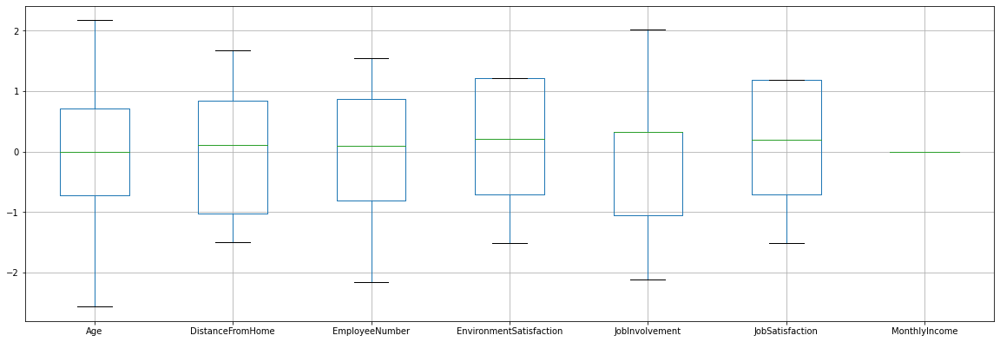

In [88]:
x.iloc[:,0:7].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

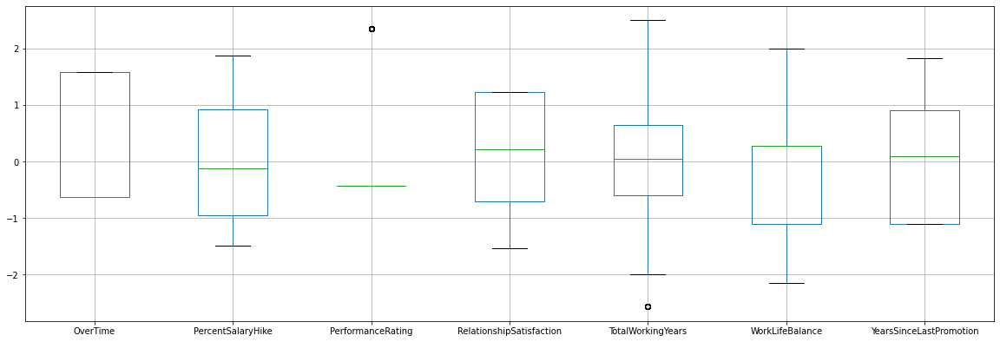

In [89]:
x.iloc[:,7:].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

Here outliers are present far away from the whiskers therefore it wont be consider as outliers 

Let's Quantify

In [92]:
from scipy.stats import zscore
(np.abs(zscore(x))<3).all()

Age                          True
DistanceFromHome             True
EmployeeNumber               True
EnvironmentSatisfaction      True
JobInvolvement               True
JobSatisfaction              True
MonthlyIncome               False
OverTime                     True
PercentSalaryHike            True
PerformanceRating            True
RelationshipSatisfaction     True
TotalWorkingYears            True
WorkLifeBalance              True
YearsSinceLastPromotion      True
dtype: bool

No outliers are present in my data

# Training process Began

In [93]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

Best Random state

In [95]:
maxaccu=0
maxrs=0
for i in range(1,1500):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    y_pred=lr.predict(x_test)
    acc=accuracy_score(y_test,y_pred)
    print('accuracy',acc,'random_state',i)
    if acc>maxaccu:
        maxaccu=acc
        maxrs=i
        print('accuracy',maxaccu,'random_state',i)

accuracy 0.8333333333333334 random_state 1
accuracy 0.8333333333333334 random_state 1
accuracy 0.8537414965986394 random_state 2
accuracy 0.8537414965986394 random_state 2
accuracy 0.8809523809523809 random_state 3
accuracy 0.8809523809523809 random_state 3
accuracy 0.8843537414965986 random_state 4
accuracy 0.8843537414965986 random_state 4
accuracy 0.8605442176870748 random_state 5
accuracy 0.8537414965986394 random_state 6
accuracy 0.8469387755102041 random_state 7
accuracy 0.8639455782312925 random_state 8
accuracy 0.8707482993197279 random_state 9
accuracy 0.8503401360544217 random_state 10
accuracy 0.8537414965986394 random_state 11
accuracy 0.8299319727891157 random_state 12
accuracy 0.8605442176870748 random_state 13
accuracy 0.8707482993197279 random_state 14
accuracy 0.8639455782312925 random_state 15
accuracy 0.8469387755102041 random_state 16
accuracy 0.8571428571428571 random_state 17
accuracy 0.8571428571428571 random_state 18
accuracy 0.8231292517006803 random_state 19
a

accuracy 0.8401360544217688 random_state 184
accuracy 0.8707482993197279 random_state 185
accuracy 0.8537414965986394 random_state 186
accuracy 0.8503401360544217 random_state 187
accuracy 0.8673469387755102 random_state 188
accuracy 0.8469387755102041 random_state 189
accuracy 0.8639455782312925 random_state 190
accuracy 0.8673469387755102 random_state 191
accuracy 0.8537414965986394 random_state 192
accuracy 0.8571428571428571 random_state 193
accuracy 0.8605442176870748 random_state 194
accuracy 0.8571428571428571 random_state 195
accuracy 0.8639455782312925 random_state 196
accuracy 0.8469387755102041 random_state 197
accuracy 0.8435374149659864 random_state 198
accuracy 0.8673469387755102 random_state 199
accuracy 0.8673469387755102 random_state 200
accuracy 0.8197278911564626 random_state 201
accuracy 0.8639455782312925 random_state 202
accuracy 0.891156462585034 random_state 203
accuracy 0.8741496598639455 random_state 204
accuracy 0.8605442176870748 random_state 205
accuracy 0.

accuracy 0.8469387755102041 random_state 370
accuracy 0.8537414965986394 random_state 371
accuracy 0.8673469387755102 random_state 372
accuracy 0.8741496598639455 random_state 373
accuracy 0.8775510204081632 random_state 374
accuracy 0.8571428571428571 random_state 375
accuracy 0.8605442176870748 random_state 376
accuracy 0.8843537414965986 random_state 377
accuracy 0.8435374149659864 random_state 378
accuracy 0.8605442176870748 random_state 379
accuracy 0.8877551020408163 random_state 380
accuracy 0.8435374149659864 random_state 381
accuracy 0.8537414965986394 random_state 382
accuracy 0.8741496598639455 random_state 383
accuracy 0.8707482993197279 random_state 384
accuracy 0.8741496598639455 random_state 385
accuracy 0.8775510204081632 random_state 386
accuracy 0.8809523809523809 random_state 387
accuracy 0.8503401360544217 random_state 388
accuracy 0.8367346938775511 random_state 389
accuracy 0.8843537414965986 random_state 390
accuracy 0.826530612244898 random_state 391
accuracy 0.

accuracy 0.8537414965986394 random_state 557
accuracy 0.8877551020408163 random_state 558
accuracy 0.8333333333333334 random_state 559
accuracy 0.8469387755102041 random_state 560
accuracy 0.826530612244898 random_state 561
accuracy 0.8877551020408163 random_state 562
accuracy 0.8639455782312925 random_state 563
accuracy 0.891156462585034 random_state 564
accuracy 0.8571428571428571 random_state 565
accuracy 0.8605442176870748 random_state 566
accuracy 0.8639455782312925 random_state 567
accuracy 0.8707482993197279 random_state 568
accuracy 0.8741496598639455 random_state 569
accuracy 0.8435374149659864 random_state 570
accuracy 0.8435374149659864 random_state 571
accuracy 0.8571428571428571 random_state 572
accuracy 0.8639455782312925 random_state 573
accuracy 0.8843537414965986 random_state 574
accuracy 0.8333333333333334 random_state 575
accuracy 0.8537414965986394 random_state 576
accuracy 0.8639455782312925 random_state 577
accuracy 0.8537414965986394 random_state 578
accuracy 0.8

accuracy 0.8503401360544217 random_state 740
accuracy 0.8741496598639455 random_state 741
accuracy 0.8809523809523809 random_state 742
accuracy 0.8775510204081632 random_state 743
accuracy 0.8571428571428571 random_state 744
accuracy 0.8367346938775511 random_state 745
accuracy 0.8843537414965986 random_state 746
accuracy 0.8401360544217688 random_state 747
accuracy 0.8809523809523809 random_state 748
accuracy 0.8571428571428571 random_state 749
accuracy 0.8571428571428571 random_state 750
accuracy 0.8401360544217688 random_state 751
accuracy 0.8503401360544217 random_state 752
accuracy 0.8299319727891157 random_state 753
accuracy 0.8571428571428571 random_state 754
accuracy 0.8571428571428571 random_state 755
accuracy 0.8299319727891157 random_state 756
accuracy 0.8571428571428571 random_state 757
accuracy 0.8367346938775511 random_state 758
accuracy 0.8707482993197279 random_state 759
accuracy 0.8639455782312925 random_state 760
accuracy 0.8809523809523809 random_state 761
accuracy 0

accuracy 0.8605442176870748 random_state 928
accuracy 0.8809523809523809 random_state 929
accuracy 0.8673469387755102 random_state 930
accuracy 0.8435374149659864 random_state 931
accuracy 0.8435374149659864 random_state 932
accuracy 0.8537414965986394 random_state 933
accuracy 0.8503401360544217 random_state 934
accuracy 0.8367346938775511 random_state 935
accuracy 0.8605442176870748 random_state 936
accuracy 0.8503401360544217 random_state 937
accuracy 0.8843537414965986 random_state 938
accuracy 0.8809523809523809 random_state 939
accuracy 0.8401360544217688 random_state 940
accuracy 0.8469387755102041 random_state 941
accuracy 0.8707482993197279 random_state 942
accuracy 0.8333333333333334 random_state 943
accuracy 0.8435374149659864 random_state 944
accuracy 0.8843537414965986 random_state 945
accuracy 0.8775510204081632 random_state 946
accuracy 0.9081632653061225 random_state 947
accuracy 0.8333333333333334 random_state 948
accuracy 0.8027210884353742 random_state 949
accuracy 0

accuracy 0.8809523809523809 random_state 1109
accuracy 0.8775510204081632 random_state 1110
accuracy 0.8231292517006803 random_state 1111
accuracy 0.8571428571428571 random_state 1112
accuracy 0.8469387755102041 random_state 1113
accuracy 0.8843537414965986 random_state 1114
accuracy 0.8503401360544217 random_state 1115
accuracy 0.8877551020408163 random_state 1116
accuracy 0.8639455782312925 random_state 1117
accuracy 0.8809523809523809 random_state 1118
accuracy 0.8537414965986394 random_state 1119
accuracy 0.8707482993197279 random_state 1120
accuracy 0.8537414965986394 random_state 1121
accuracy 0.8673469387755102 random_state 1122
accuracy 0.8741496598639455 random_state 1123
accuracy 0.8741496598639455 random_state 1124
accuracy 0.8843537414965986 random_state 1125
accuracy 0.8605442176870748 random_state 1126
accuracy 0.8605442176870748 random_state 1127
accuracy 0.8537414965986394 random_state 1128
accuracy 0.8401360544217688 random_state 1129
accuracy 0.8435374149659864 random

accuracy 0.826530612244898 random_state 1295
accuracy 0.8843537414965986 random_state 1296
accuracy 0.8537414965986394 random_state 1297
accuracy 0.8775510204081632 random_state 1298
accuracy 0.8197278911564626 random_state 1299
accuracy 0.8605442176870748 random_state 1300
accuracy 0.9013605442176871 random_state 1301
accuracy 0.8877551020408163 random_state 1302
accuracy 0.8571428571428571 random_state 1303
accuracy 0.8877551020408163 random_state 1304
accuracy 0.8571428571428571 random_state 1305
accuracy 0.8503401360544217 random_state 1306
accuracy 0.8197278911564626 random_state 1307
accuracy 0.8707482993197279 random_state 1308
accuracy 0.8707482993197279 random_state 1309
accuracy 0.8435374149659864 random_state 1310
accuracy 0.8605442176870748 random_state 1311
accuracy 0.8843537414965986 random_state 1312
accuracy 0.8639455782312925 random_state 1313
accuracy 0.8571428571428571 random_state 1314
accuracy 0.8639455782312925 random_state 1315
accuracy 0.8367346938775511 random_

accuracy 0.8639455782312925 random_state 1477
accuracy 0.8775510204081632 random_state 1478
accuracy 0.826530612244898 random_state 1479
accuracy 0.8741496598639455 random_state 1480
accuracy 0.8537414965986394 random_state 1481
accuracy 0.9047619047619048 random_state 1482
accuracy 0.8741496598639455 random_state 1483
accuracy 0.8537414965986394 random_state 1484
accuracy 0.8843537414965986 random_state 1485
accuracy 0.8843537414965986 random_state 1486
accuracy 0.8809523809523809 random_state 1487
accuracy 0.8605442176870748 random_state 1488
accuracy 0.9013605442176871 random_state 1489
accuracy 0.8707482993197279 random_state 1490
accuracy 0.8741496598639455 random_state 1491
accuracy 0.8537414965986394 random_state 1492
accuracy 0.8809523809523809 random_state 1493
accuracy 0.8469387755102041 random_state 1494
accuracy 0.8333333333333334 random_state 1495
accuracy 0.8741496598639455 random_state 1496
accuracy 0.8469387755102041 random_state 1497
accuracy 0.8469387755102041 random_

In [96]:
print('Best accuracy is ',maxaccu,'on random state ',maxrs)

Best accuracy is  0.9183673469387755 on random state  923


We have found best random state value as 923. we will create our train_test_split using this 
random_state.

# Creating Train test split

In [97]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=923)

In [98]:
x_train

,Age,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsSinceLastPromotion
213,1.450117,0.243416,-1.218449,-0.706596,-1.058710,-0.709062,0.0,-0.628241,0.478687,-0.423557,1.229016,0.760056,-2.144446,1.105970
496,-2.035132,1.356120,-0.480489,0.208597,0.326033,0.197856,0.0,-0.628241,-1.488918,-0.423557,0.225164,-1.279754,0.276821,0.096854
1462,0.316210,1.456094,1.530728,-0.706596,-1.058710,1.192743,0.0,-0.628241,-1.488918,-0.423557,-1.529513,1.224037,-1.108624,1.590412
776,-2.205428,0.367247,0.187580,1.209516,0.326033,1.192743,0.0,1.591746,-0.121307,-0.423557,-0.700130,-1.591480,0.276821,-1.094862
1391,0.210221,-1.494085,1.410805,-1.518118,-1.058710,-1.509980,0.0,-0.628241,-0.121307,-0.423557,-1.529513,1.137690,-1.108624,-1.094862
203,0.420154,1.188948,-1.252841,0.208597,0.326033,1.192743,0.0,1.591746,0.201133,-0.423557,0.225164,0.655988,1.998177,0.905592
1051,0.817147,-1.494085,0.774549,-1.518118,0.326033,0.197856,0.0,-0.628241,-0.948760,-0.423557,0.225164,0.186750,-1.108624,-1.094862
280,1.618691,-0.700347,-1.022199,0.208597,0.326033,0.197856,0.0,1.591746,0.478687,-0.423557,1.229016,1.224037,-1.108624,0.096854
733,-1.264315,-1.031215,0.096575,1.209516,2.014107,1.192743,0.0,-0.628241,-0.948760,-0.423557,-0.700130,-0.244305,0.276821,0.096854
944,-0.987055,-1.494085,0.540224,0.208597,-2.120625,1.192743,0.0,-0.628241,-1.488918,-0.423557,-1.529513,0.052495,0.276821,1.454429


In [99]:
x_test

,Age,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsSinceLastPromotion
431,1.701159,0.243416,-0.645193,0.208597,0.326033,0.197856,0.0,-0.628241,-1.488918,-0.423557,0.225164,1.048395,0.276821,-1.094862
959,0.420154,-1.031215,0.584645,0.208597,0.326033,1.192743,0.0,-0.628241,-0.499665,-0.423557,0.225164,-0.090665,0.276821,1.528318
1417,-0.597882,-1.031215,1.455191,-1.518118,0.326033,0.197856,0.0,-0.628241,1.116668,-0.423557,0.225164,-1.279754,0.276821,0.096854
930,1.450117,-0.050827,0.514283,-0.706596,-1.058710,0.197856,0.0,-0.628241,-0.121307,-0.423557,-0.700130,-0.244305,-1.108624,1.454429
319,-0.474486,0.243416,-0.919344,0.208597,-1.058710,-0.709062,0.0,1.591746,-1.488918,-0.423557,1.229016,0.433228,0.276821,1.689587
910,-1.711882,-1.494085,0.475163,1.209516,0.326033,0.197856,0.0,-0.628241,1.560773,2.348814,1.229016,-1.988249,0.276821,-1.094862
1160,0.912074,-1.031215,0.984789,1.209516,-1.058710,1.192743,0.0,-0.628241,1.116668,-0.423557,-1.529513,0.052495,0.276821,0.905592
1457,0.420154,-1.031215,1.524460,0.208597,0.326033,0.197856,0.0,-0.628241,-0.121307,-0.423557,-0.700130,1.137690,0.276821,-1.094862
28,0.817147,0.105316,-1.963754,-1.518118,-1.058710,1.192743,0.0,-0.628241,-0.121307,-0.423557,1.229016,1.467504,0.276821,1.252109
978,0.420154,-1.031215,0.625916,-0.706596,2.014107,0.197856,0.0,-0.628241,1.281630,2.348814,-0.700130,0.655988,0.276821,1.689587


In [100]:
y_train

213     0
496     0
1462    0
776     1
1391    0
203     0
1051    0
280     0
733     0
944     0
57      0
530     0
1054    0
1402    0
447     0
1221    0
186     0
929     0
1021    1
430     0
388     0
152     0
966     1
1134    0
309     0
185     0
942     0
589     1
678     0
924     0
1453    0
626     0
842     1
620     0
1443    0
415     1
1455    0
1171    1
56      0
100     1
631     0
118     0
1177    0
378     1
245     0
995     0
449     0
113     0
870     0
1332    1
619     0
247     0
968     0
904     0
483     0
994     0
1087    0
278     0
633     0
70      0
1264    0
353     0
504     1
246     0
1274    0
460     0
30      0
597     0
820     0
1300    0
1078    0
39      0
862     0
516     0
1325    0
1012    1
351     0
1458    0
236     1
555     0
535     0
445     0
482     1
335     0
206     0
913     1
332     0
1246    1
126     1
1338    1
1220    0
745     0
381     0
250     1
961     0
401     0
594     0
702     0
1360    0
923     0


In [101]:
y_test

431     0
959     0
1417    0
930     0
319     0
910     0
1160    0
1457    0
28      0
978     0
87      0
237     0
515     0
202     0
1311    0
759     0
143     0
1350    0
473     0
82      0
218     0
1428    0
1460    0
828     1
582     0
660     1
900     0
1265    0
1318    0
393     0
1322    0
1073    0
810     0
297     0
112     0
48      0
1185    0
772     0
361     0
519     0
139     0
730     0
564     0
1055    0
1306    0
760     0
1196    0
1115    0
1132    0
945     0
782     0
522     0
503     0
1245    0
386     0
617     0
750     0
472     0
1093    0
295     0
1218    0
814     0
66      0
1181    0
1316    0
843     0
263     0
1381    0
763     0
1323    0
615     0
891     0
972     0
698     0
1079    0
612     0
1385    0
1035    0
630     0
1070    0
505     0
681     0
933     0
606     0
766     0
1327    0
1066    0
540     1
804     0
1238    0
400     0
1433    0
543     0
1415    0
85      0
943     0
416     0
987     0
1098    0
1413    0


In [102]:
x_train.shape

(1176, 14)

In [103]:
x_test.shape

(294, 14)

In [104]:
y_train.shape

(1176,)

In [105]:
y_test.shape

(294,)

# Logistic Regression

In [107]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_train,y_train)
y_pred=lr.predict(x_test)
print('Accuracy',accuracy_score(y_test,y_pred)*100)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

Accuracy 91.83673469387756
[[258   3]
 [ 21  12]]
              precision    recall  f1-score   support

           0       0.92      0.99      0.96       261
           1       0.80      0.36      0.50        33

    accuracy                           0.92       294
   macro avg       0.86      0.68      0.73       294
weighted avg       0.91      0.92      0.90       294



# Decision Tree Classifer

In [108]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y_pred=dt.predict(x_test)
print('Accuracy',accuracy_score(y_test,y_pred)*100)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

Accuracy 77.89115646258503
[[217  44]
 [ 21  12]]
              precision    recall  f1-score   support

           0       0.91      0.83      0.87       261
           1       0.21      0.36      0.27        33

    accuracy                           0.78       294
   macro avg       0.56      0.60      0.57       294
weighted avg       0.83      0.78      0.80       294



# Random Forest Classifier

In [109]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
y_pred=rf.predict(x_test)
print('Accuracy',accuracy_score(y_test,y_pred)*100)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

Accuracy 90.81632653061224
[[258   3]
 [ 24   9]]
              precision    recall  f1-score   support

           0       0.91      0.99      0.95       261
           1       0.75      0.27      0.40        33

    accuracy                           0.91       294
   macro avg       0.83      0.63      0.68       294
weighted avg       0.90      0.91      0.89       294



In [110]:
rf

RandomForestClassifier()

# Support Vector Classifier - SVC

In [111]:
from sklearn.svm import SVC
svc=SVC()
svc.fit(x_train,y_train)
y_pred=svc.predict(x_test)
print('Accuracy',accuracy_score(y_test,y_pred)*100)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

Accuracy 91.49659863945578
[[260   1]
 [ 24   9]]
              precision    recall  f1-score   support

           0       0.92      1.00      0.95       261
           1       0.90      0.27      0.42        33

    accuracy                           0.91       294
   macro avg       0.91      0.63      0.69       294
weighted avg       0.91      0.91      0.89       294



In [113]:
from sklearn.ensemble import AdaBoostClassifier
ad=AdaBoostClassifier()
ad.fit(x_train,y_train)
y_pred=ad.predict(x_test)
print('Accuracy',accuracy_score(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

Accuracy 0.9081632653061225
[[255   6]
 [ 21  12]]
              precision    recall  f1-score   support

           0       0.92      0.98      0.95       261
           1       0.67      0.36      0.47        33

    accuracy                           0.91       294
   macro avg       0.80      0.67      0.71       294
weighted avg       0.90      0.91      0.90       294



From the above model we can conclude that the Logisitic Regression model produces better accuracy among
all other model after that Random forest and Support vector also AdaBoost picks consecutive places

# Cross Validation

In [114]:
from sklearn.model_selection import cross_val_score
scr=cross_val_score(lr,x,y,cv=5)
print('Cross validation of Logistic Regression model:',scr.mean())

Cross validation of Logistic Regression model: 0.8612244897959183


In [115]:
scr2=cross_val_score(dt,x,y,cv=5)
print('Cross validation score of Decision Tree Classifier :',scr2.mean())

Cross validation score of Decision Tree Classifier : 0.7693877551020408


In [117]:
scr3=cross_val_score(rf,x,y,cv=5)
print('Cross validation score of Random Forest classifier:',scr3.mean())

Cross validation score of Random Forest classifier: 0.8476190476190476


In [118]:
scr4=cross_val_score(svc,x,y,cv=5)
print('Cross validation score of Support vector classifier :',scr4.mean())

Cross validation score of Support vector classifier : 0.8517006802721088


In [119]:
scr5=cross_val_score(ad,x,y,cv=5)
print('Cross validation score of Ada Boost Classifier :',scr5.mean())

Cross validation score of Ada Boost Classifier : 0.8462585034013606


Cross validation score of Logistic regression is higher than the all the other models and Support 
vector stands next to this 